In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

: **Import Libraries**

In [1]:
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import seaborn as sns

# **Step 1: Load and Preprocess Data**

In [2]:


# Define dataset path)
dataset_path = "/kaggle/input/chest-xray-pneumonia/chest_xray/train"

# Function to load images and labels
def load_images_from_folder(folder, target_size=(224, 224)):
    images, labels = [], []
    classes = ['NORMAL', 'PNEUMONIA']  # Class names in dataset

    for label, subfolder in enumerate(classes):
        subfolder_path = os.path.join(folder, subfolder)
        for filename in os.listdir(subfolder_path):
            img_path = os.path.join(subfolder_path, filename)
            img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)  # Read in grayscale
            if img is not None:
                img = cv2.resize(img, target_size)  # Resize to 224x224
                images.append(img)
                labels.append(label)  # Assign label (0: NORMAL, 1: PNEUMONIA)

    return np.array(images), np.array(labels)

# Load the images and labels
X, y = load_images_from_folder(dataset_path)

# Print shapes
print(f"✅ X shape: {X.shape}")  # (num_samples, 224, 224)
print(f"✅ y shape: {y.shape}")  # (num_samples,)


✅ X shape: (5216, 224, 224)
✅ y shape: (5216,)


In [3]:
print(f"✅ Min pixel value: {X.min()}")
print(f"✅ Max pixel value: {X.max()}")


✅ Min pixel value: 0
✅ Max pixel value: 255


# **Plot Sample Images Before Preprocessing**

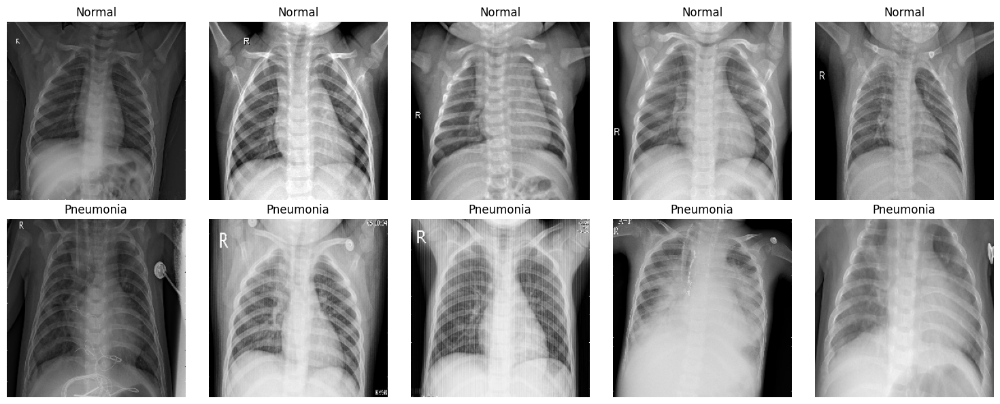

In [4]:
import matplotlib.pyplot as plt

# Select 5 images from each class
num_samples = 5
normal_images = X[y == 0][:num_samples]
pneumonia_images = X[y == 1][:num_samples]

# Plot images
fig, axes = plt.subplots(2, num_samples, figsize=(15, 6))
axes = axes.ravel()

for i in range(num_samples):
    axes[i].imshow(normal_images[i].reshape(224, 224), cmap="gray")
    axes[i].set_title("Normal")
    axes[i + num_samples].imshow(pneumonia_images[i].reshape(224, 224), cmap="gray")
    axes[i + num_samples].set_title("Pneumonia")

for ax in axes:
    ax.axis("off")

plt.tight_layout()
plt.show()


# **Apply Flattening & Normalization**

In [5]:
# Flatten images
X = X.reshape(X.shape[0], -1)  # (5216, 50176)

# Normalize pixel values
X = X / 255.0

# Print new shape
print(f"✅ X reshaped: {X.shape}")  # Expected: (5216, 50176)


✅ X reshaped: (5216, 50176)


**Display Images After Normalization & Reshaping**

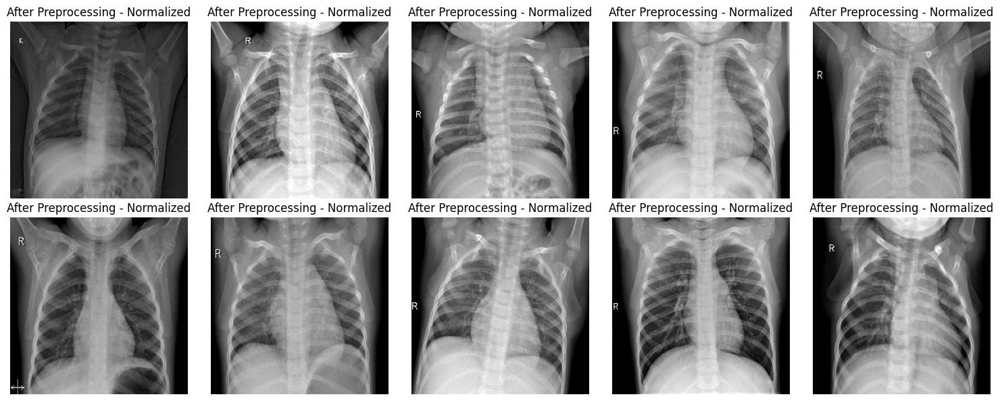

In [6]:
fig, axes = plt.subplots(2, num_samples, figsize=(15, 6))
axes = axes.ravel()

for i in range(num_samples):
    axes[i].imshow(X[i].reshape(224, 224), cmap="gray")
    axes[i].set_title("After Preprocessing - Normalized")

    axes[i + num_samples].imshow(X[i + len(normal_images)].reshape(224, 224), cmap="gray")
    axes[i + num_samples].set_title("After Preprocessing - Normalized")

for ax in axes:
    ax.axis("off")

plt.tight_layout()
plt.show()

**1️⃣ Display Sample Images from Both Categories (Normal & Pneumonia)**

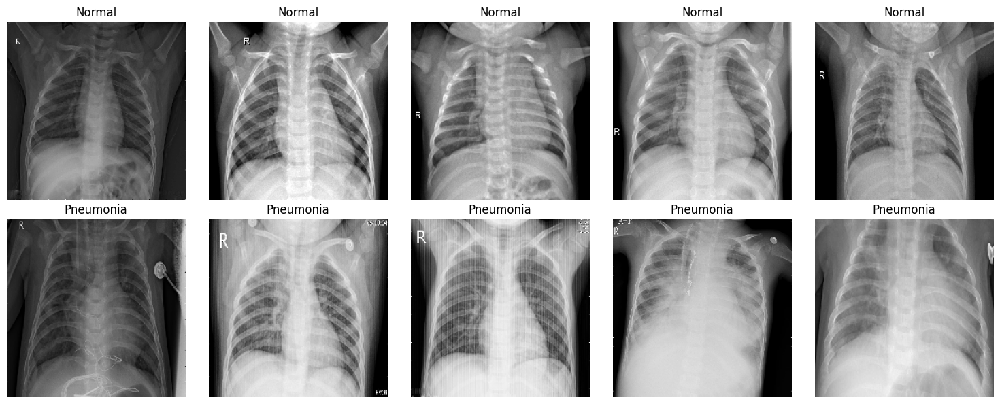

In [7]:
import matplotlib.pyplot as plt

# Select 5 images from each class
num_samples = 5
normal_images = X[y == 0][:num_samples]
pneumonia_images = X[y == 1][:num_samples]

# Plot images
fig, axes = plt.subplots(2, num_samples, figsize=(15, 6))
axes = axes.ravel()

for i in range(num_samples):
    axes[i].imshow(normal_images[i].reshape(224, 224), cmap="gray")
    axes[i].set_title("Normal")
    axes[i + num_samples].imshow(pneumonia_images[i].reshape(224, 224), cmap="gray")
    axes[i + num_samples].set_title("Pneumonia")

for ax in axes:
    ax.axis("off")

plt.tight_layout()
plt.show()


# **Step 2: Split Data into Different Train-Test Splits**


In [8]:
from sklearn.model_selection import train_test_split

# Split data into 90:10, 80:20, and 70:30
X_train_90, X_test_90, y_train_90, y_test_90 = train_test_split(X, y, test_size=0.10, random_state=42, stratify=y)
X_train_80, X_test_80, y_train_80, y_test_80 = train_test_split(X, y, test_size=0.20, random_state=42, stratify=y)
X_train_70, X_test_70, y_train_70, y_test_70 = train_test_split(X, y, test_size=0.30, random_state=42, stratify=y)

# Print dataset shapes to verify
print(f"✅ 90:10 - Train: {X_train_90.shape}, Test: {X_test_90.shape}")
print(f"✅ 80:20 - Train: {X_train_80.shape}, Test: {X_test_80.shape}")
print(f"✅ 70:30 - Train: {X_train_70.shape}, Test: {X_test_70.shape}")


✅ 90:10 - Train: (4694, 50176), Test: (522, 50176)
✅ 80:20 - Train: (4172, 50176), Test: (1044, 50176)
✅ 70:30 - Train: (3651, 50176), Test: (1565, 50176)


**Train & Evaluate SVM on All Split**


🔹 Training SVM on 90:10 split...
✅ 90:10 Accuracy: 0.9598

Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.92      0.92       134
           1       0.97      0.97      0.97       388

    accuracy                           0.96       522
   macro avg       0.95      0.95      0.95       522
weighted avg       0.96      0.96      0.96       522



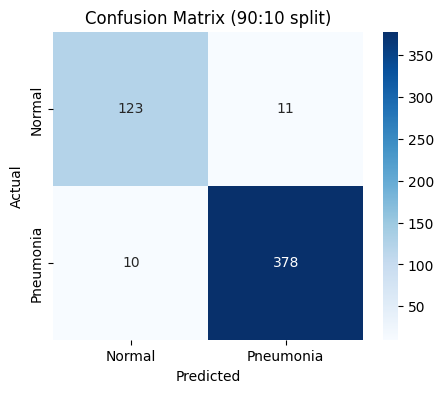

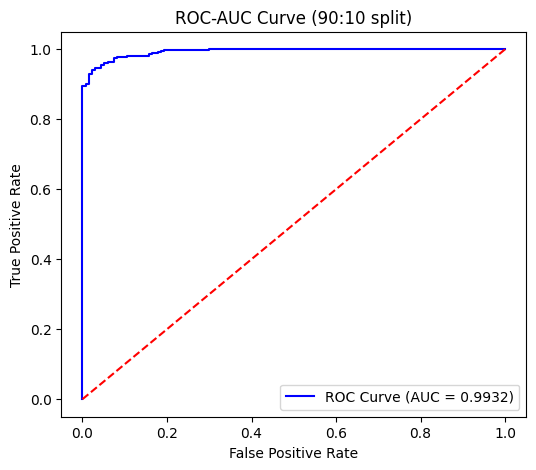


🔹 Training SVM on 80:20 split...
✅ 80:20 Accuracy: 0.9550

Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.89      0.91       268
           1       0.96      0.98      0.97       776

    accuracy                           0.95      1044
   macro avg       0.95      0.93      0.94      1044
weighted avg       0.95      0.95      0.95      1044



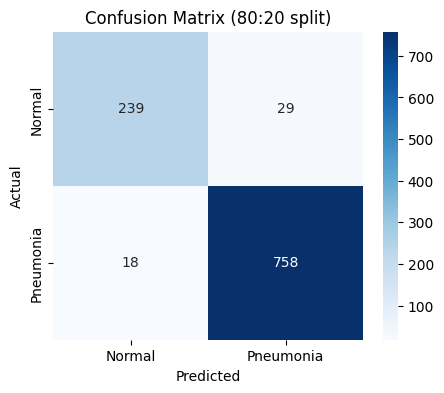

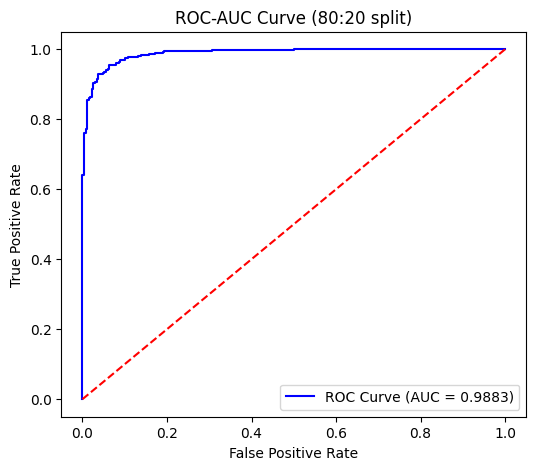


🔹 Training SVM on 70:30 split...
✅ 70:30 Accuracy: 0.9591

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.90      0.92       402
           1       0.97      0.98      0.97      1163

    accuracy                           0.96      1565
   macro avg       0.95      0.94      0.95      1565
weighted avg       0.96      0.96      0.96      1565



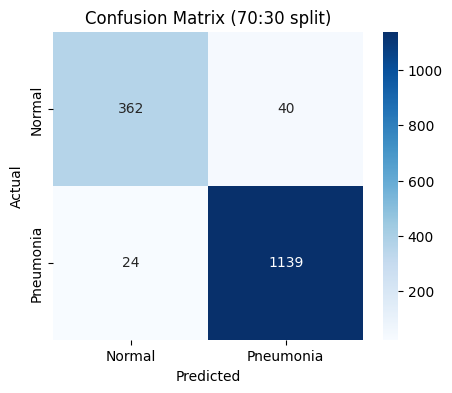

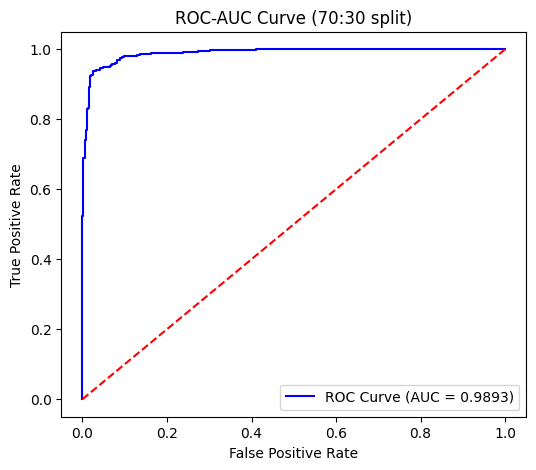

In [9]:
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, roc_curve, accuracy_score
import seaborn as sns

# Function to train and evaluate SVM
def train_evaluate_svm(X_train, X_test, y_train, y_test, split_ratio):
    print(f"\n🔹 Training SVM on {split_ratio} split...")
    
    # Initialize SVM model
    svm_model = SVC(kernel='linear', probability=True, random_state=42)
    
    # Train the model
    svm_model.fit(X_train, y_train)
    
    # Predictions
    y_pred = svm_model.predict(X_test)
    y_prob = svm_model.predict_proba(X_test)[:, 1]  # Probabilities for ROC-AUC

    # Evaluation metrics
    accuracy = accuracy_score(y_test, y_pred)
    print(f"✅ {split_ratio} Accuracy: {accuracy:.4f}")
    
    print("\nClassification Report:")
    print(classification_report(y_test, y_pred))

    # Confusion Matrix
    plt.figure(figsize=(5, 4))
    sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt="d", cmap="Blues", xticklabels=['Normal', 'Pneumonia'], yticklabels=['Normal', 'Pneumonia'])
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.title(f"Confusion Matrix ({split_ratio} split)")
    plt.show()
    
    # ROC-AUC Curve
    fpr, tpr, _ = roc_curve(y_test, y_prob)
    auc_score = roc_auc_score(y_test, y_prob)
    
    plt.figure(figsize=(6, 5))
    plt.plot(fpr, tpr, color='blue', label=f'ROC Curve (AUC = {auc_score:.4f})')
    plt.plot([0, 1], [0, 1], color='red', linestyle='--')
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title(f"ROC-AUC Curve ({split_ratio} split)")
    plt.legend()
    plt.show()
    
    return svm_model

# Train & Evaluate SVM on all splits
svm_90 = train_evaluate_svm(X_train_90, X_test_90, y_train_90, y_test_90, "90:10")
svm_80 = train_evaluate_svm(X_train_80, X_test_80, y_train_80, y_test_80, "80:20")
svm_70 = train_evaluate_svm(X_train_70, X_test_70, y_train_70, y_test_70, "70:30")


#  **Test SVM on 15 Random Images**

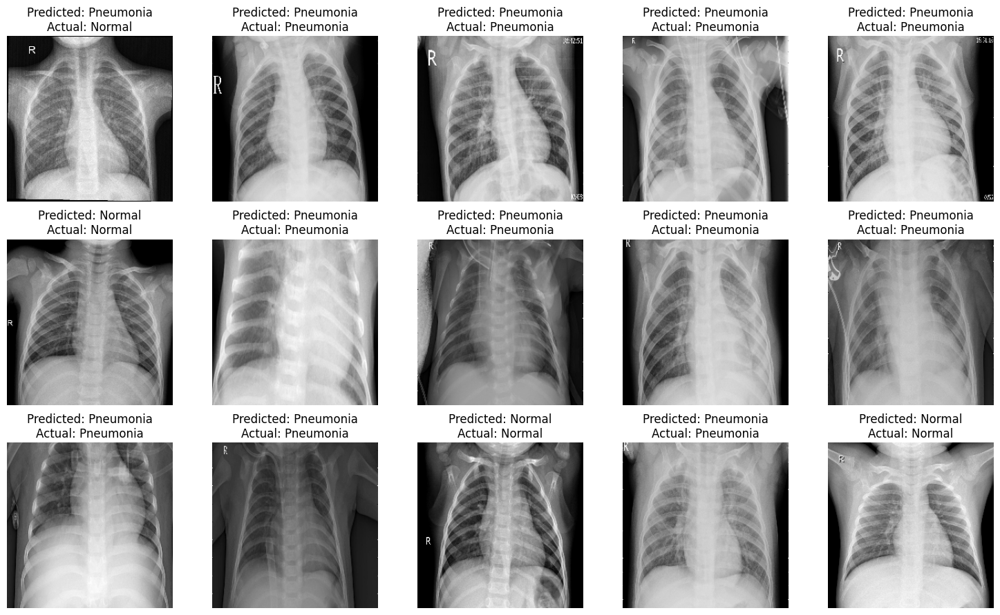

In [10]:
import random

def test_random_images(model, X_test, y_test, num_samples=15):
    indices = random.sample(range(len(X_test)), num_samples)
    selected_images = X_test[indices]
    true_labels = y_test[indices]

    predictions = model.predict(selected_images)

    # Plot images with predicted labels
    fig, axes = plt.subplots(3, 5, figsize=(15, 9))
    axes = axes.ravel()

    for i in range(num_samples):
        img = selected_images[i].reshape(224, 224)  # Reshape to image format
        axes[i].imshow(img, cmap="gray")
        axes[i].set_title(f"Predicted: {'Pneumonia' if predictions[i] == 1 else 'Normal'}\nActual: {'Pneumonia' if true_labels[i] == 1 else 'Normal'}")
        axes[i].axis("off")

    plt.tight_layout()
    plt.show()

# Test SVM on 15 random images (using 90:10 model)
test_random_images(svm_90, X_test_90, y_test_90)


In [11]:
import joblib
import pandas as pd

# ✅ Save the trained SVM models
joblib.dump(svm_90, "svm_model_90.pkl")  # Model for 90:10 split
joblib.dump(svm_80, "svm_model_80.pkl")  # Model for 80:20 split
joblib.dump(svm_70, "svm_model_70.pkl")  # Model for 70:30 split

print("✅ SVM models saved successfully as .pkl files!")

# ⚡ Make predictions before saving results
y_pred_90 = svm_90.predict(X_test_90)
y_pred_80 = svm_80.predict(X_test_80)
y_pred_70 = svm_70.predict(X_test_70)

# ✅ Save predictions & actual results
svm_results_90 = pd.DataFrame({"Actual": y_test_90, "Predicted": y_pred_90})
svm_results_80 = pd.DataFrame({"Actual": y_test_80, "Predicted": y_pred_80})
svm_results_70 = pd.DataFrame({"Actual": y_test_70, "Predicted": y_pred_70})

# Save results as CSV files
svm_results_90.to_csv("svm_results_90.csv", index=False)
svm_results_80.to_csv("svm_results_80.csv", index=False)
svm_results_70.to_csv("svm_results_70.csv", index=False)

print("✅ SVM predictions saved as CSV files!")


✅ SVM models saved successfully as .pkl files!
✅ SVM predictions saved as CSV files!


# **Train & Evaluate Logistic Regression on 90:10, 80:20, and 70:30 Splits**


📊 Training Logistic Regression on 90:10 split...
✅ 90:10 Accuracy: 0.9579

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.90      0.92       134
           1       0.96      0.98      0.97       388

    accuracy                           0.96       522
   macro avg       0.95      0.94      0.94       522
weighted avg       0.96      0.96      0.96       522



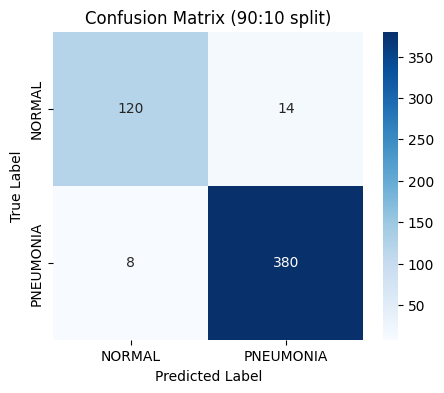


📊 Training Logistic Regression on 80:20 split...
✅ 80:20 Accuracy: 0.9521

Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.88      0.90       268
           1       0.96      0.98      0.97       776

    accuracy                           0.95      1044
   macro avg       0.95      0.93      0.94      1044
weighted avg       0.95      0.95      0.95      1044



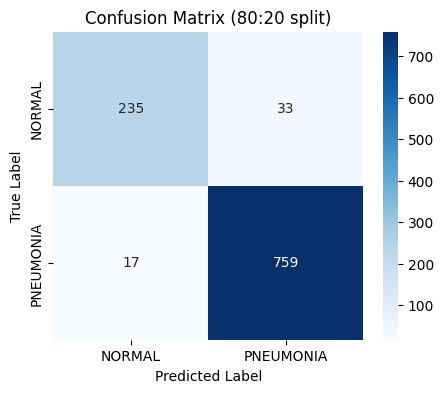


📊 Training Logistic Regression on 70:30 split...
✅ 70:30 Accuracy: 0.9572

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.89      0.91       402
           1       0.96      0.98      0.97      1163

    accuracy                           0.96      1565
   macro avg       0.95      0.94      0.94      1565
weighted avg       0.96      0.96      0.96      1565



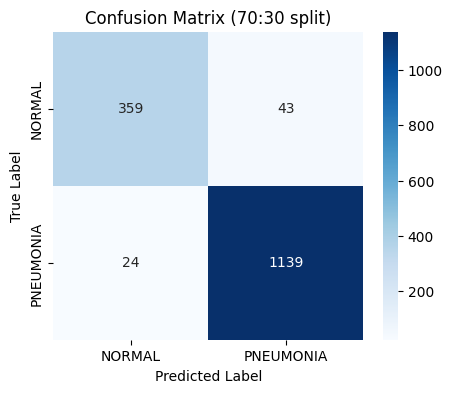

In [12]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import joblib
import pandas as pd

# 🚀 Function to Train & Evaluate Logistic Regression
def train_evaluate_lr(X_train, X_test, y_train, y_test, split_name):
    print(f"\n📊 Training Logistic Regression on {split_name} split...")

    # Initialize Logistic Regression (with L2 regularization)
    lr = LogisticRegression(max_iter=1000, solver='liblinear', random_state=42)

    # Train the model
    lr.fit(X_train, y_train)

    # Predictions
    y_pred = lr.predict(X_test)

    # Accuracy
    accuracy = accuracy_score(y_test, y_pred)
    print(f"✅ {split_name} Accuracy: {accuracy:.4f}\n")

    # Classification Report
    print("Classification Report:")
    print(classification_report(y_test, y_pred))

    # Confusion Matrix
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(5, 4))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["NORMAL", "PNEUMONIA"], yticklabels=["NORMAL", "PNEUMONIA"])
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.title(f"Confusion Matrix ({split_name} split)")
    plt.show()
    
    return lr, y_pred

# 🎯 Train & Evaluate Logistic Regression on all splits
lr_90, y_pred_90 = train_evaluate_lr(X_train_90, X_test_90, y_train_90, y_test_90, "90:10")
lr_80, y_pred_80 = train_evaluate_lr(X_train_80, X_test_80, y_train_80, y_test_80, "80:20")
lr_70, y_pred_70 = train_evaluate_lr(X_train_70, X_test_70, y_train_70, y_test_70, "70:30")



 # **Test Logistic Regression on 15 Random Images**

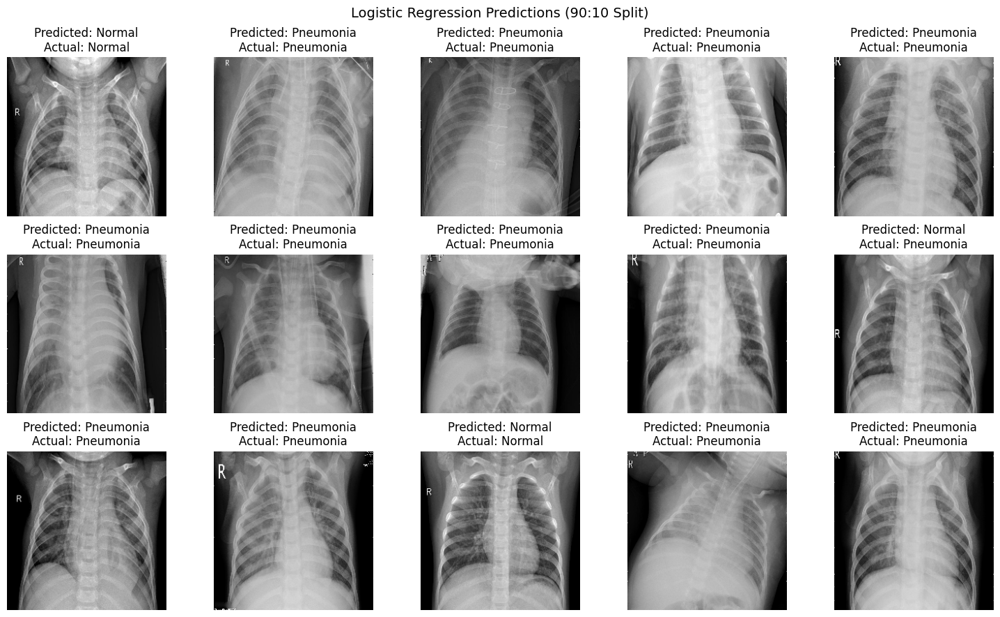

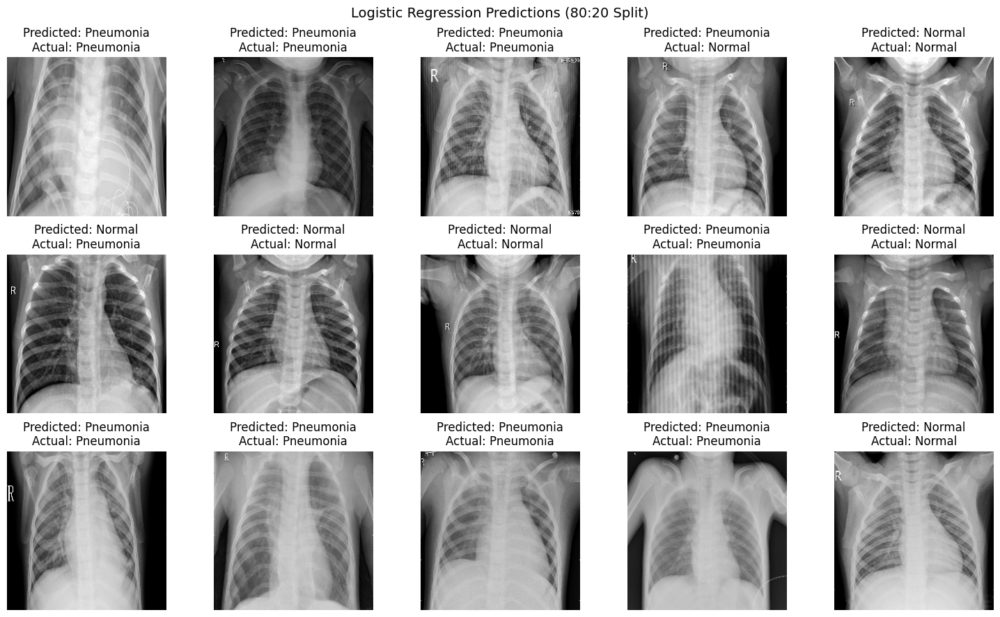

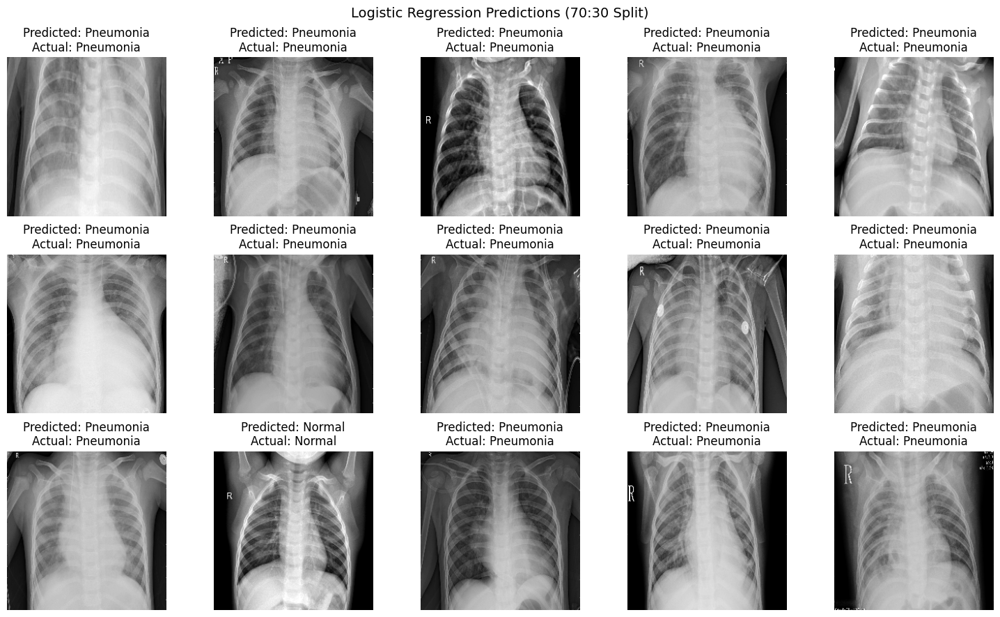

In [15]:
import random
import matplotlib.pyplot as plt

def test_random_images_lr(model, X_test, y_test, split_name, num_samples=15, img_size=(224, 224)):
    indices = random.sample(range(len(X_test)), num_samples)
    selected_images = X_test[indices]
    true_labels = y_test[indices]

    # Make predictions
    predictions = model.predict(selected_images)

    # Plot images with predicted labels
    fig, axes = plt.subplots(3, 5, figsize=(15, 9))
    axes = axes.ravel()

    for i in range(num_samples):
        img = X_test[indices[i]].reshape(img_size)  # Ensure correct shape
        axes[i].imshow(img, cmap="gray")
        axes[i].set_title(f"Predicted: {'Pneumonia' if predictions[i] == 1 else 'Normal'}\nActual: {'Pneumonia' if true_labels[i] == 1 else 'Normal'}")
        axes[i].axis("off")

    plt.suptitle(f"Logistic Regression Predictions ({split_name} Split)", fontsize=14)
    plt.tight_layout()
    plt.show()

# 🔥 Test Logistic Regression on All Splits
test_random_images_lr(lr_90, X_test_90, y_test_90, "90:10")
test_random_images_lr(lr_80, X_test_80, y_test_80, "80:20")
test_random_images_lr(lr_70, X_test_70, y_test_70, "70:30")


# **Save the trained models**

In [16]:
# ✅ Save the trained models
joblib.dump(lr_90, "logistic_regression_90.pkl")
joblib.dump(lr_80, "logistic_regression_80.pkl")
joblib.dump(lr_70, "logistic_regression_70.pkl")
print("✅ Logistic Regression models saved successfully!")

# ✅ Save Predictions & Actual Results
lr_results_90 = pd.DataFrame({"Actual": y_test_90, "Predicted": y_pred_90})
lr_results_80 = pd.DataFrame({"Actual": y_test_80, "Predicted": y_pred_80})
lr_results_70 = pd.DataFrame({"Actual": y_test_70, "Predicted": y_pred_70})

lr_results_90.to_csv("logistic_regression_results_90.csv", index=False)
lr_results_80.to_csv("logistic_regression_results_80.csv", index=False)
lr_results_70.to_csv("logistic_regression_results_70.csv", index=False)
print("✅ Logistic Regression predictions saved as CSV files!")

✅ Logistic Regression models saved successfully!
✅ Logistic Regression predictions saved as CSV files!


# **Train & Evaluate Random Forest**

🌲 Training Random Forest on 90:10 split...
✅ 90:10 Accuracy: 0.9732

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.93      0.95       134
           1       0.97      0.99      0.98       388

    accuracy                           0.97       522
   macro avg       0.97      0.96      0.96       522
weighted avg       0.97      0.97      0.97       522



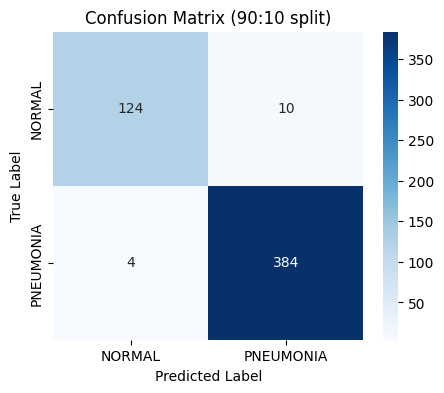

🌲 Training Random Forest on 80:20 split...
✅ 80:20 Accuracy: 0.9559

Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.89      0.91       268
           1       0.96      0.98      0.97       776

    accuracy                           0.96      1044
   macro avg       0.95      0.93      0.94      1044
weighted avg       0.96      0.96      0.96      1044



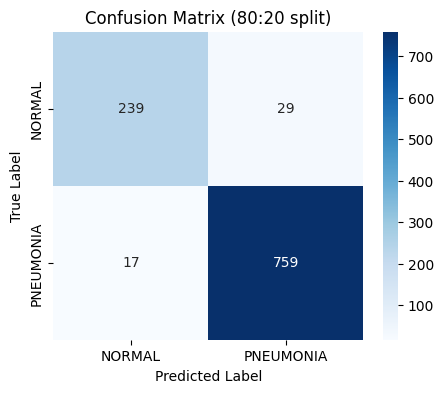

🌲 Training Random Forest on 70:30 split...
✅ 70:30 Accuracy: 0.9623

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.91      0.93       402
           1       0.97      0.98      0.97      1163

    accuracy                           0.96      1565
   macro avg       0.96      0.94      0.95      1565
weighted avg       0.96      0.96      0.96      1565



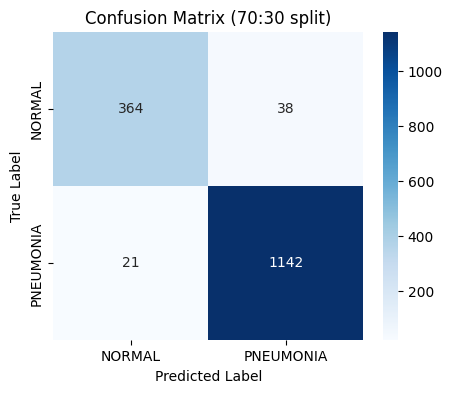

In [17]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import random

# 🚀 Function to Train & Evaluate Random Forest
def train_evaluate_rf(X_train, X_test, y_train, y_test, split_name):
    print(f"🌲 Training Random Forest on {split_name} split...")

    # Initialize Random Forest with optimized hyperparameters
    rf = RandomForestClassifier(n_estimators=100, max_depth=None, random_state=42)
    
    # Train the model
    rf.fit(X_train, y_train)

    # Predictions
    y_pred = rf.predict(X_test)

    # Accuracy
    accuracy = accuracy_score(y_test, y_pred)
    print(f"✅ {split_name} Accuracy: {accuracy:.4f}\n")

    # Classification Report
    print("Classification Report:")
    print(classification_report(y_test, y_pred))

    # Confusion Matrix
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(5, 4))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["NORMAL", "PNEUMONIA"], yticklabels=["NORMAL", "PNEUMONIA"])
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.title(f"Confusion Matrix ({split_name} split)")
    plt.show()
    
    return rf, y_pred

# 🎯 Train & Evaluate Random Forest on all splits
rf_90, y_pred_90 = train_evaluate_rf(X_train_90, X_test_90, y_train_90, y_test_90, "90:10")
rf_80, y_pred_80 = train_evaluate_rf(X_train_80, X_test_80, y_train_80, y_test_80, "80:20")
rf_70, y_pred_70 = train_evaluate_rf(X_train_70, X_test_70, y_train_70, y_test_70, "70:30")





In [18]:
# 🔥 Print Summary of Accuracy Results for Random Forest
print("\n📊 **Final Accuracy Scores for Random Forest on Different Splits:**")

# Compute accuracy separately
acc_90 = accuracy_score(y_test_90, y_pred_90) * 100  # Convert to percentage
acc_80 = accuracy_score(y_test_80, y_pred_80) * 100
acc_70 = accuracy_score(y_test_70, y_pred_70) * 100

print(f"🔹 90:10 Split Accuracy: {acc_90:.2f}%")
print(f"🔹 80:20 Split Accuracy: {acc_80:.2f}%")
print(f"🔹 70:30 Split Accuracy: {acc_70:.2f}%")



📊 **Final Accuracy Scores for Random Forest on Different Splits:**
🔹 90:10 Split Accuracy: 97.32%
🔹 80:20 Split Accuracy: 95.59%
🔹 70:30 Split Accuracy: 96.23%


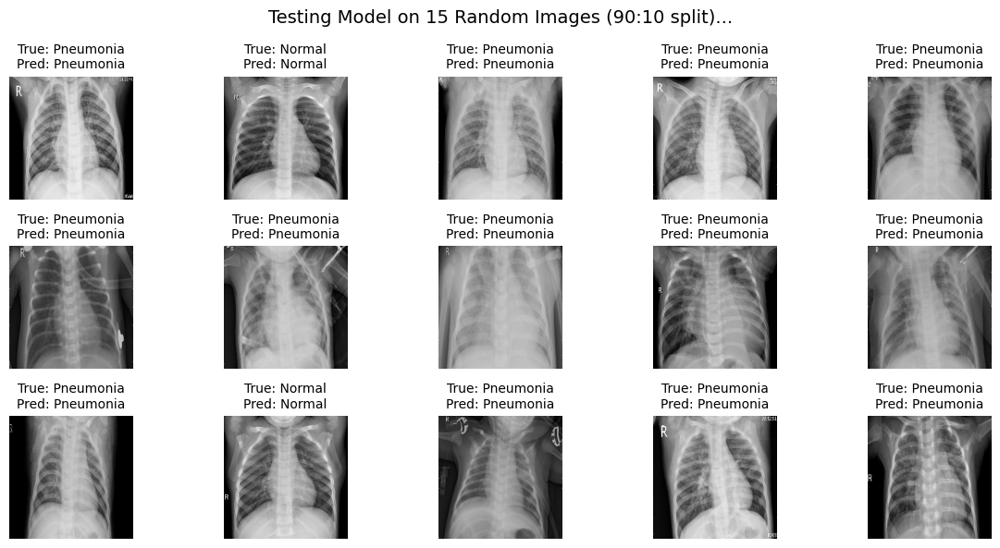

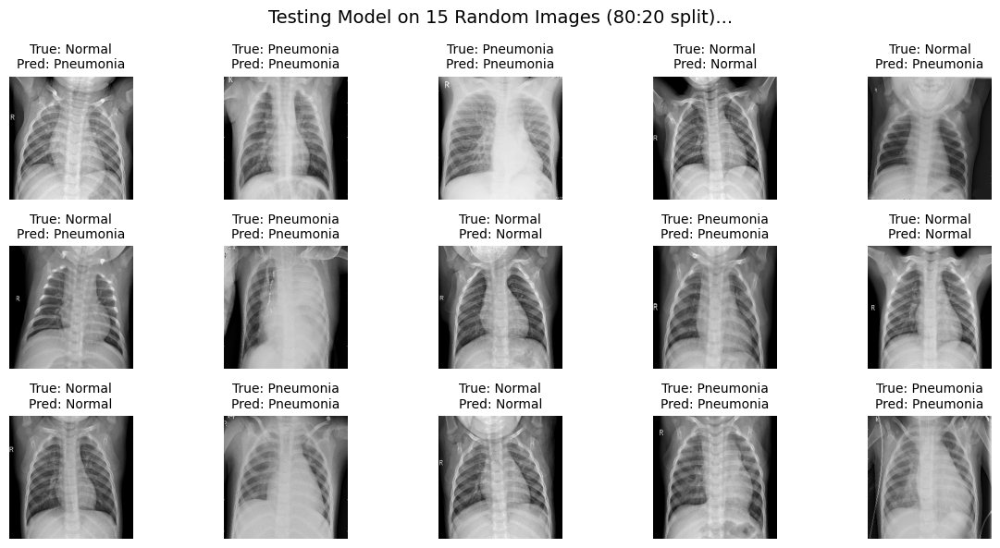

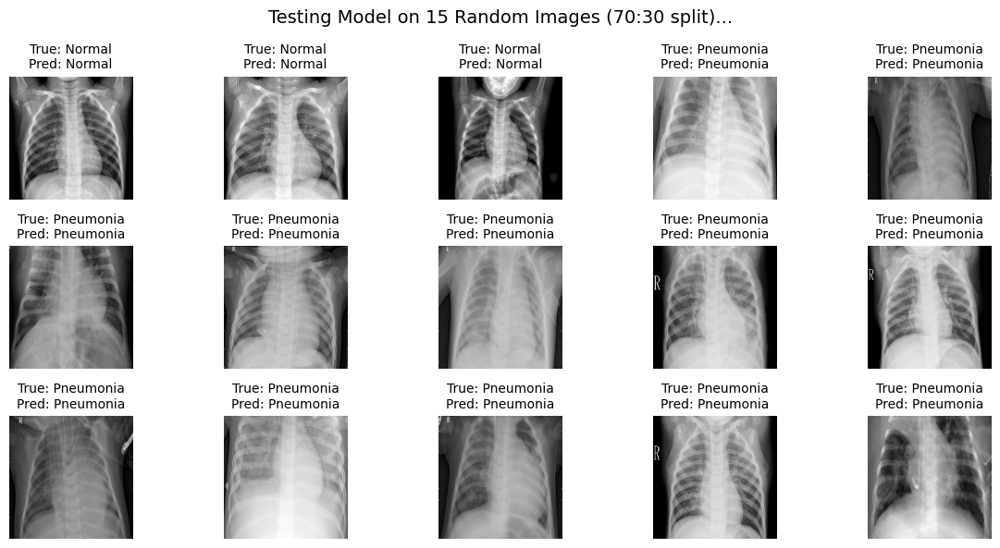

In [19]:
# 🔍 Visualize Predictions
import random
import numpy as np
import matplotlib.pyplot as plt

# 📷 Function to Predict & Plot 15 Random Images
def plot_random_predictions(X_test, y_test, y_pred, split_name, img_size=(224, 224)):
    indices = random.sample(range(len(X_test)), 15)  # Select 15 random images
    
    plt.figure(figsize=(12, 6))

    for i, idx in enumerate(indices):
        img = X_test[idx].reshape(img_size)  # ✅ FIXED RESHAPE SIZE
        true_label = "Pneumonia" if y_test[idx] == 1 else "Normal"
        pred_label = "Pneumonia" if y_pred[idx] == 1 else "Normal"

        plt.subplot(3, 5, i + 1)
        plt.imshow(img, cmap="gray")
        plt.title(f"True: {true_label}\nPred: {pred_label}", fontsize=10)  # ✅ Labels on separate lines
        plt.axis("off")

    plt.suptitle(f"Testing Model on 15 Random Images ({split_name} split)...", fontsize=14)
    plt.tight_layout()
    plt.show()

# 🔍 Visualize Predictions for Different Splits
plot_random_predictions(X_test_90, y_test_90, y_pred_90, "90:10", img_size=(224, 224))
plot_random_predictions(X_test_80, y_test_80, y_pred_80, "80:20", img_size=(224, 224))
plot_random_predictions(X_test_70, y_test_70, y_pred_70, "70:30", img_size=(224, 224))


In [20]:
import joblib
import pandas as pd

# ✅ Save trained RF models
joblib.dump(rf_90, "random_forest_90.pkl")
joblib.dump(rf_80, "random_forest_80.pkl")
joblib.dump(rf_70, "random_forest_70.pkl")

print("✅ Random Forest models saved successfully!")

# ✅ Load RF models when needed
rf_90 = joblib.load("random_forest_90.pkl")
rf_80 = joblib.load("random_forest_80.pkl")
rf_70 = joblib.load("random_forest_70.pkl")

print("✅ Random Forest models loaded successfully!")


✅ Random Forest models saved successfully!
✅ Random Forest models loaded successfully!


In [21]:
# ✅ Save Predictions & Actual Results for Random Forest
rf_results_90 = pd.DataFrame({"Actual": y_test_90, "Predicted": y_pred_90})
rf_results_80 = pd.DataFrame({"Actual": y_test_80, "Predicted": y_pred_80})
rf_results_70 = pd.DataFrame({"Actual": y_test_70, "Predicted": y_pred_70})

# Save to CSV
rf_results_90.to_csv("random_forest_results_90.csv", index=False)
rf_results_80.to_csv("random_forest_results_80.csv", index=False)
rf_results_70.to_csv("random_forest_results_70.csv", index=False)

print("✅ Random Forest predictions saved as CSV files!")


✅ Random Forest predictions saved as CSV files!



📊 **Testing Models on 90:10 Split:**


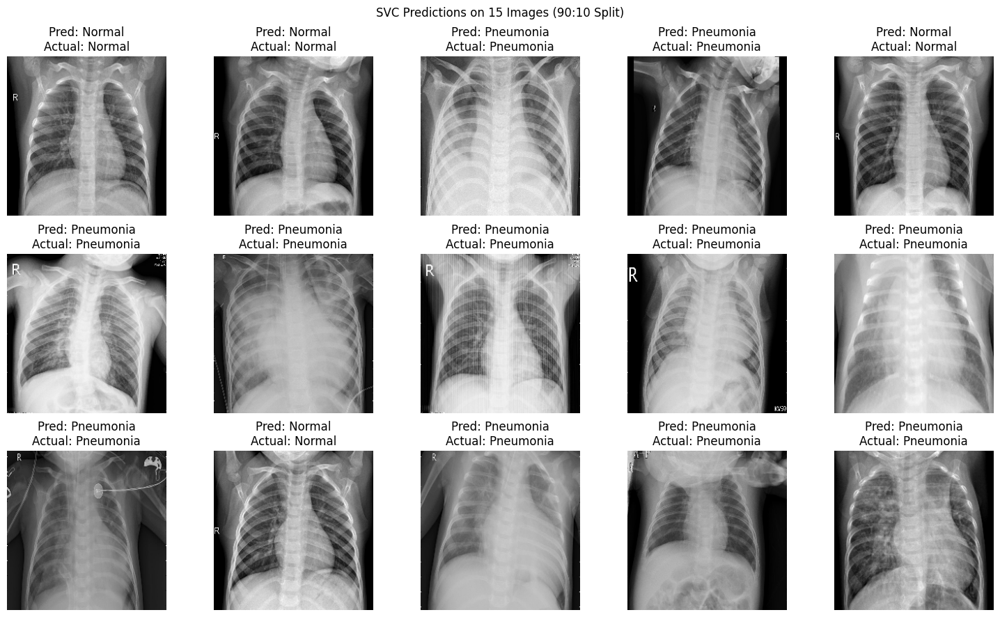

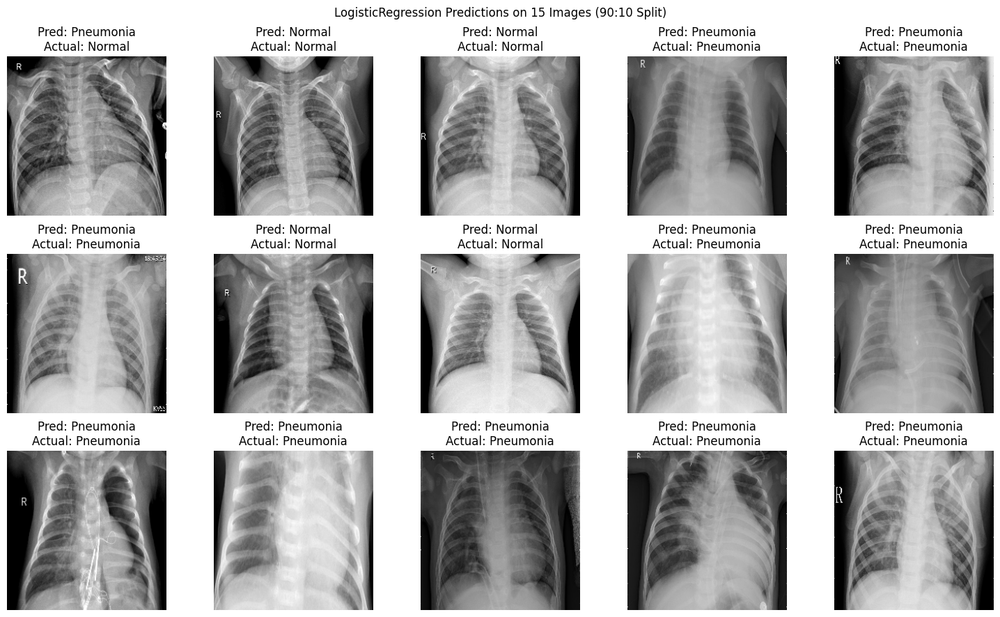

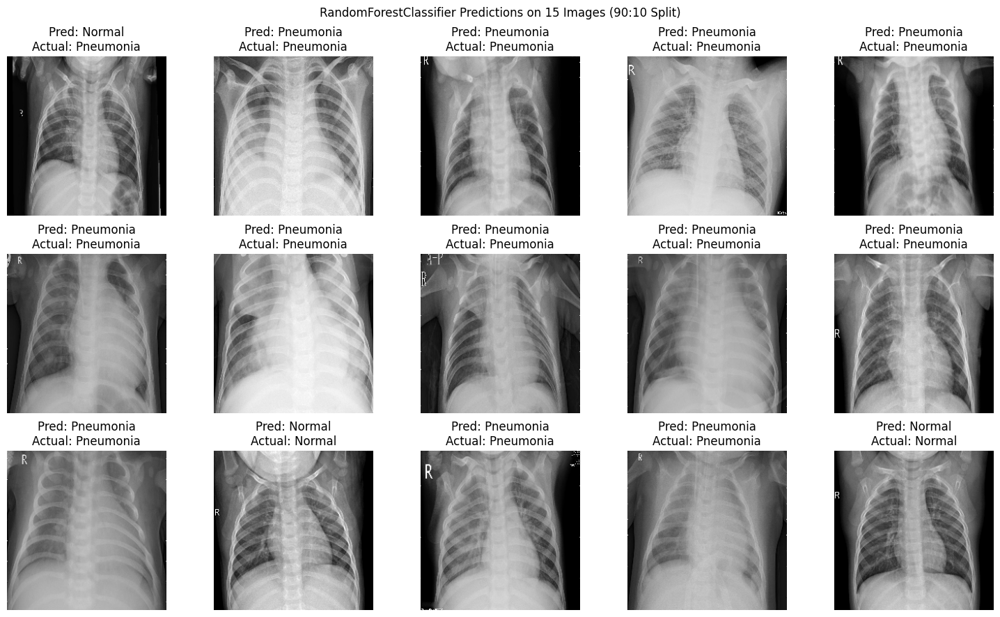


📊 **Testing Models on 80:20 Split:**


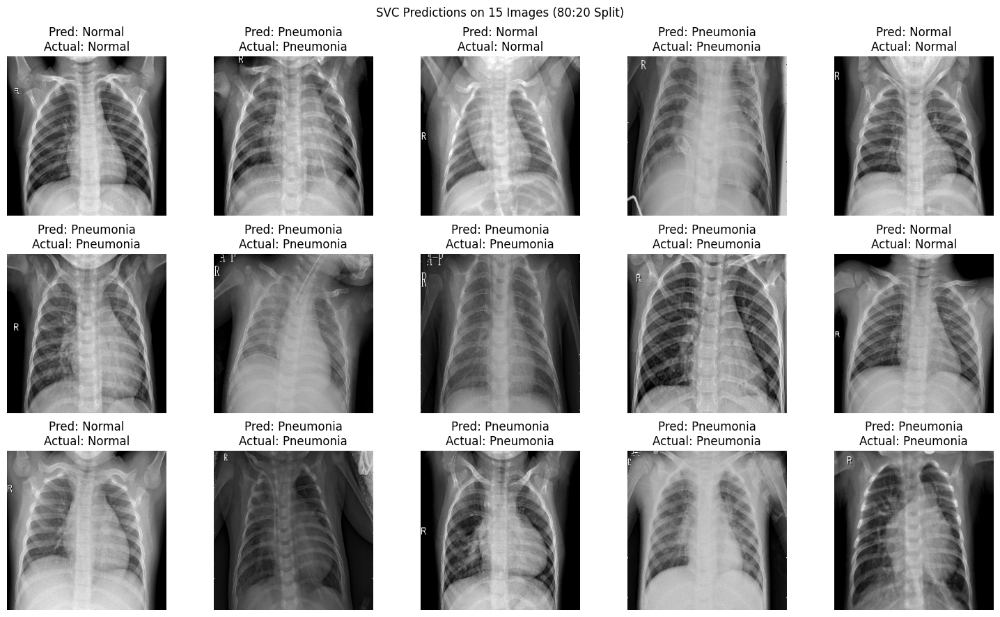

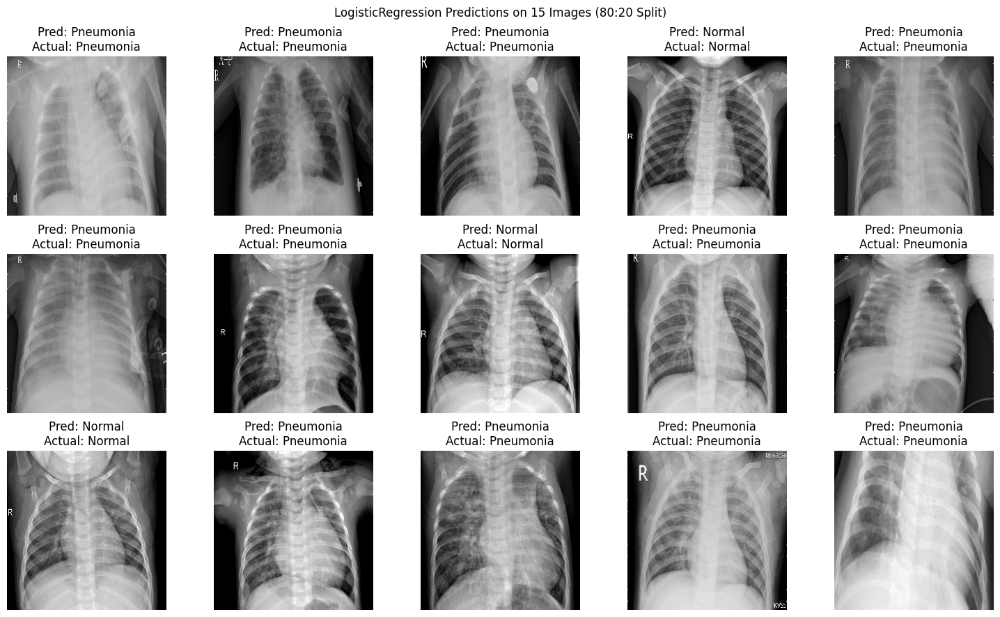

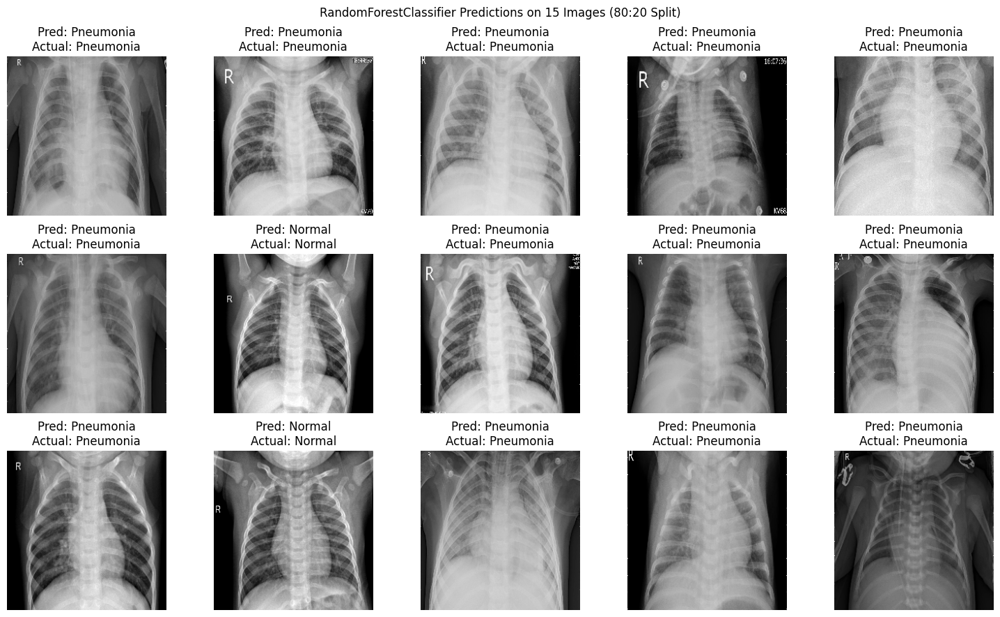


📊 **Testing Models on 70:30 Split:**


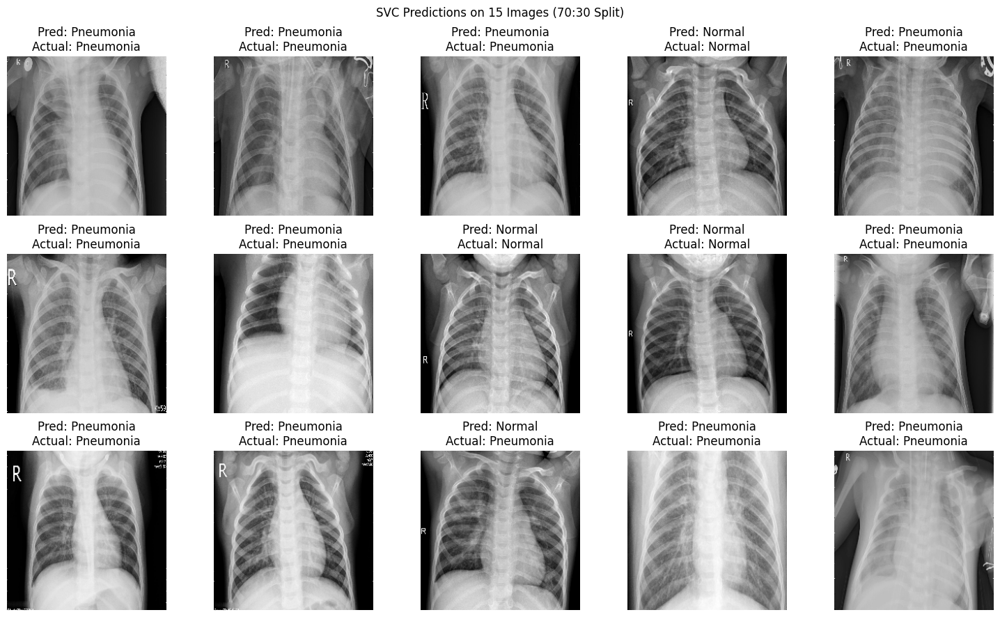

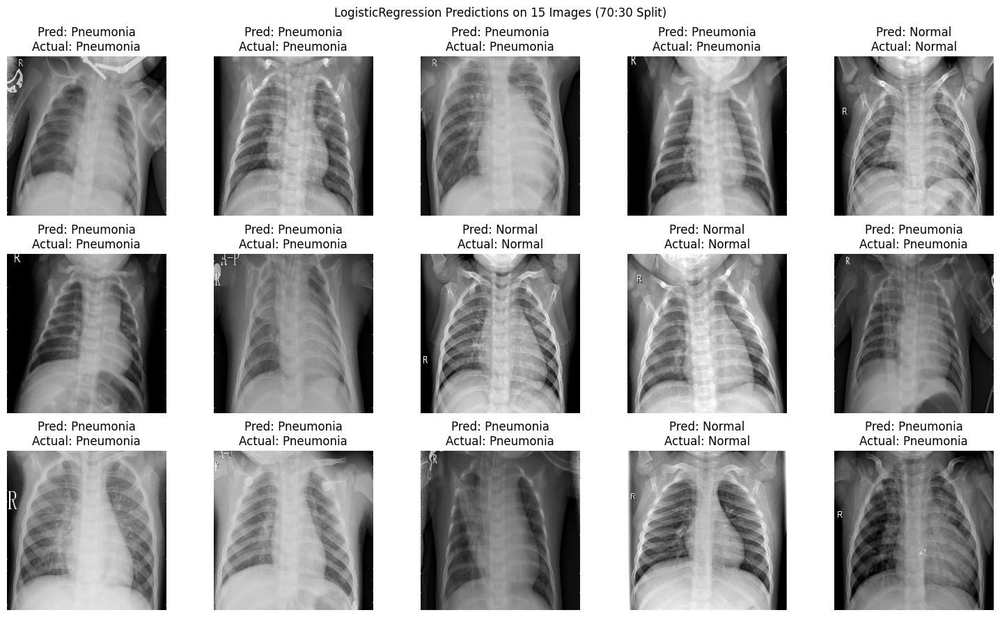

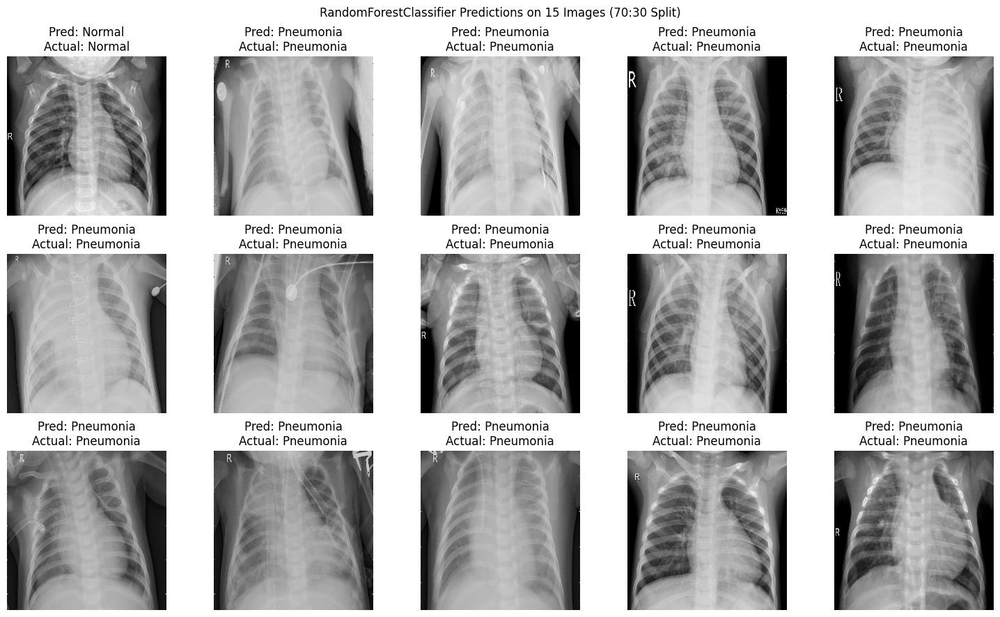

In [23]:
import random
import matplotlib.pyplot as plt

# ✅ Define splits dictionary manually
splits = {
    "90:10": (X_train_90, X_test_90, y_train_90, y_test_90),
    "80:20": (X_train_80, X_test_80, y_train_80, y_test_80),
    "70:30": (X_train_70, X_test_70, y_train_70, y_test_70),
}

# ✅ Define models dictionary (Ensure these are trained models)
svm_models = {
    "90:10": svm_90,
    "80:20": svm_80,
    "70:30": svm_70,
}

lr_models = {
    "90:10": lr_90,
    "80:20": lr_80,
    "70:30": lr_70,
}

rf_models = {
    "90:10": rf_90,
    "80:20": rf_80,
    "70:30": rf_70,
}

# 🚀 Function to Test Random Images
def test_random_images(model, X_test, y_test, split_name):
    """
    Selects 15 random images from the test set, makes predictions using the given model, 
    and visualizes the actual vs. predicted labels.
    """
    indices = random.sample(range(len(X_test)), 15)  # Select 15 random indices
    selected_images = X_test[indices]  # Get images
    true_labels = y_test[indices]  

    # Make predictions
    predictions = model.predict(selected_images)

    # Plot images with predicted labels
    fig, axes = plt.subplots(3, 5, figsize=(15, 9))
    axes = axes.ravel()

    for i in range(15):
        img = selected_images[i].reshape(224, 224)  # Reshape for visualization
        true_label = "Pneumonia" if true_labels[i] == 1 else "Normal"
        pred_label = "Pneumonia" if predictions[i] == 1 else "Normal"

        axes[i].imshow(img, cmap="gray")
        axes[i].set_title(f"Pred: {pred_label}\nActual: {true_label}")
        axes[i].axis("off")

    plt.suptitle(f"{model.__class__.__name__} Predictions on 15 Images ({split_name} Split)")
    plt.tight_layout()
    plt.show()

# 🔥 Test SVM, LR, and RF on 15 random images from each split
for split_name, (X_train, X_test, y_train, y_test) in splits.items():
    print(f"\n📊 **Testing Models on {split_name} Split:**")
    
    test_random_images(svm_models[split_name], X_test, y_test, split_name)
    test_random_images(lr_models[split_name], X_test, y_test, split_name)
    test_random_images(rf_models[split_name], X_test, y_test, split_name)
